# Import de Module

In [10]:
import os
import numpy as np 
import warnings
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

warnings.filterwarnings('ignore')

# Load des fichiers

In [11]:
B_D = '/kaggle/input/anime-faces/data'

In [12]:
image_paths = []
for image_name in os.listdir(B_D):
    image_path = os.path.join(B_D,image_name)
    image_paths.append(image_path)

In [13]:
image_paths[:5]

['/kaggle/input/anime-faces/data/21130.png',
 '/kaggle/input/anime-faces/data/9273.png',
 '/kaggle/input/anime-faces/data/18966.png',
 '/kaggle/input/anime-faces/data/14127.png',
 '/kaggle/input/anime-faces/data/18054.png']

In [14]:
image_paths.remove('/kaggle/input/anime-faces/data/data')
len(image_paths)

21551

# Visualisation Des Datas

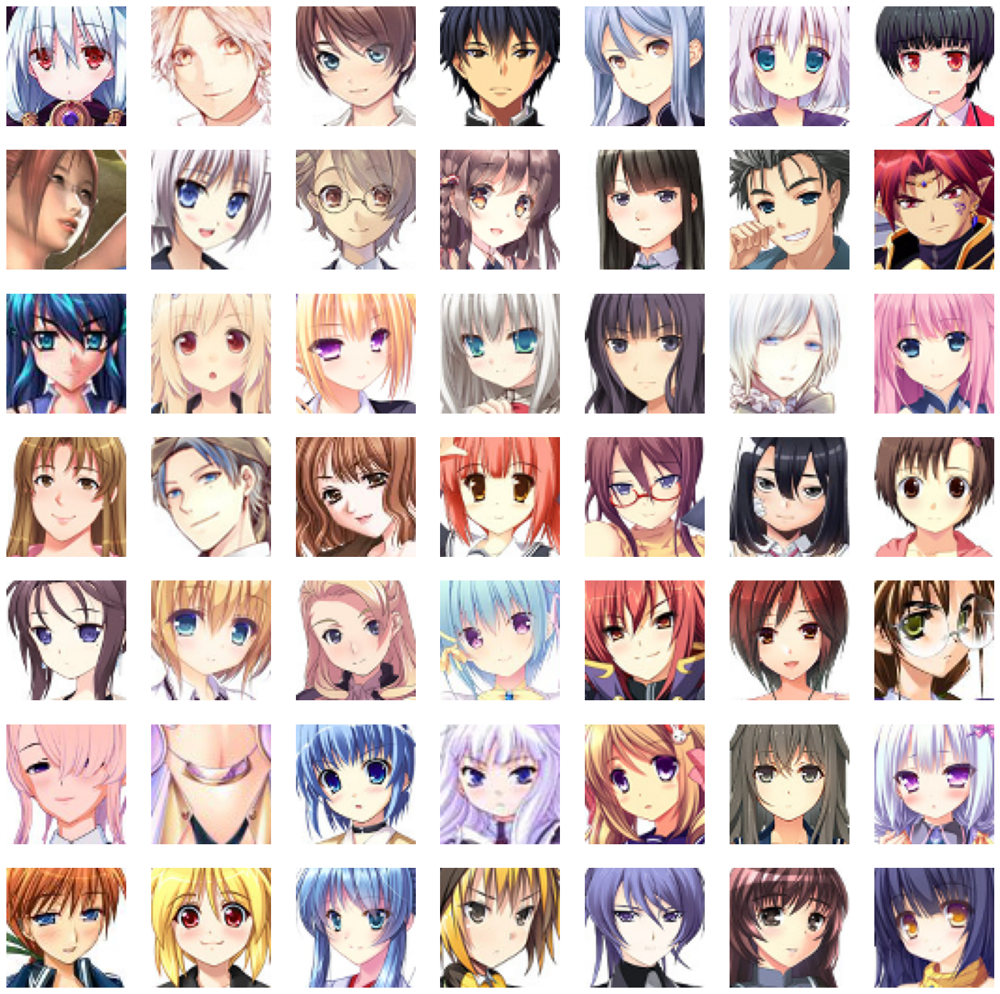

In [15]:
plt.figure(figsize = (20,20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7,7, index)
    img = load_img(image_path)
    img = np.array(img)
    plt.imshow(img)
    plt.axis('off')
    index += 1

# Preprocess des images

In [16]:
train_images = [np.array(load_img(path)) for path in tqdm(image_paths)]
train_images = np.array(train_images)

  0%|          | 0/21551 [00:00<?, ?it/s]

In [17]:
train_images.shape

(21551, 64, 64, 3)

In [18]:
train_images = train_images.reshape(train_images.shape[0],64,64,3).astype('float32') # reshaping

In [19]:
# Normalisation 
train_images = (train_images - 127.5) / 127.5

In [20]:
train_images[0]

array([[[-0.7254902 , -0.90588236, -0.7176471 ],
        [-0.70980394, -0.88235295, -0.6862745 ],
        [-0.7019608 , -1.        , -0.7176471 ],
        ...,
        [-0.09019608,  0.01176471,  0.3882353 ],
        [-0.19215687,  0.05882353,  0.4509804 ],
        [-0.34117648, -0.13725491,  0.29411766]],

       [[-0.7254902 , -0.90588236, -0.7176471 ],
        [-0.73333335, -0.8666667 , -0.7019608 ],
        [-0.52156866, -0.8666667 , -0.5686275 ],
        ...,
        [-0.29411766,  0.01176471,  0.3019608 ],
        [-0.08235294,  0.15294118,  0.5294118 ],
        [-0.23921569,  0.09019608,  0.45882353]],

       [[-0.7019608 , -0.8901961 , -0.7019608 ],
        [-0.7176471 , -0.8745098 , -0.69411767],
        [-0.5686275 , -0.8509804 , -0.58431375],
        ...,
        [-0.22352941,  0.1764706 ,  0.48235294],
        [-0.13725491,  0.1764706 ,  0.4745098 ],
        [-0.06666667,  0.24705882,  0.5058824 ]],

       ...,

       [[-0.30980393, -0.6862745 , -0.29411766],
        [-0

# Generator Model

In [21]:
LANTENT_DIM = 100 
# Init des poids 
WEIGHT_INIT = keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)
CHANNELS = 3

# Generator

In [22]:
model = Sequential(name = 'generator')

model.add(layers.Dense(8 * 8 * 512, input_dim = LANTENT_DIM))
model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# Convertion
model.add(layers.Reshape((8,8,512)))

#16x16
model.add(layers.Conv2DTranspose(256, (4,4), strides=(2,2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.BatchNormalization())
model.add(layers.ReLU())

#32x32
model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.BatchNormalization())
model.add(layers.ReLU())

#64x64
model.add(layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4,4), padding='same', activation='tanh'))

generator = model
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 32768)               │       3,309,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32768)               │         131,072 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 256)         │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 3)           │           3,075 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,198,467 (23.65 MB)

 Trainable params: 6,132,035 (23.39 MB)

 Non-trainable params: 66,432 (259.50 KB)

# Discriminator Model

In [23]:
model = Sequential(name = 'discriminator')
input_shape = (64,64,3)
alpha = 0.2

model.add(layers.Conv2D(64, (4,4), strides=(2,2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4,4), strides=(2,2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4,4), strides=(2,2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

model.add(layers.Dense(1, activation='sigmoid'))

discriminator = model
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 128)           │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

# DCGAN

In [24]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        #entrainement du discriminator avec les images reels(1) et les non-reels(0)
        with tf.GradientTape() as tape:
            #perte sur les images reels
            pred_real = self.discriminator(real_images, training=True)
            real_labels = tf.ones((batch_size,1))
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)

            #perte sur les images non-reels
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            fake_labels = tf.zeros((batch_size,1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            d_loss = (d_loss_real + d_loss_fake) / 2

        # gradient du discriminator 
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # maj du grad
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))

        #entrainement du generator 
        labels = tf.ones((batch_size, 1))

        with tf.GradientTape() as tape:
            fake_images = self.generator(random_noise, training=True)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(labels, pred_fake)

        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # maj des deux models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss': self.d_loss_metric.result(), 'g_loss' : self.g_loss_metric.result()}

In [31]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=4, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # generation de l'image en fonction du bruit
        g_img = self.model.generator(self.noise)
        # denormalisation
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()

        fig = plt.figure(figsize=(8,8))
        for i in range(self.num_imgs):
            plt.subplot(5,5,i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [32]:
dcgan = DCGAN(generator = generator, discriminator = discriminator, latent_dim = LANTENT_DIM)

In [33]:
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_optimizer = Adam(learning_rate = G_LR, beta_1 = 0.5), d_optimizer = Adam(learning_rate = D_LR, beta_1 = 0.5), loss_fn = BinaryCrossentropy())

Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - d_loss: -0.5741 - g_loss: 0.2355

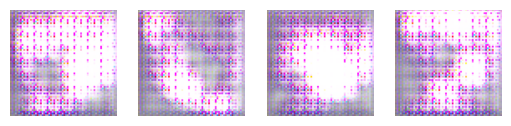

674/674 ━━━━━━━━━━━━━━━━━━━━ 48s 51ms/step - d_loss: -0.5744 - g_loss: 0.2354
Epoch 2/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -1.4386 - g_loss: 0.2650

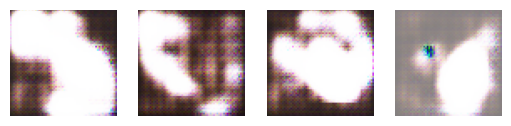

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -1.4388 - g_loss: 0.2655
Epoch 3/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -1.3459 - g_loss: 0.4023

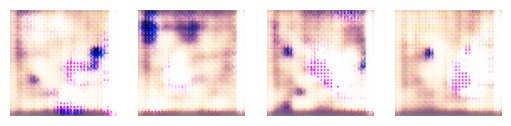

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -1.3464 - g_loss: 0.4027
Epoch 4/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -2.2113 - g_loss: 1.1044

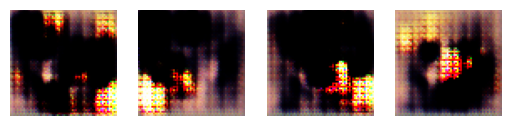

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -2.2121 - g_loss: 1.1049
Epoch 5/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -3.0350 - g_loss: 0.8416

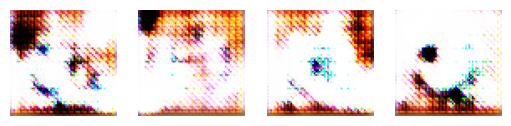

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -3.0347 - g_loss: 0.8415
Epoch 6/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -5.2897 - g_loss: 0.4885

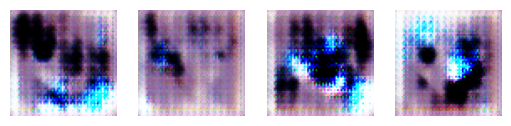

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -5.2914 - g_loss: 0.4889
Epoch 7/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -7.2455 - g_loss: 1.5131

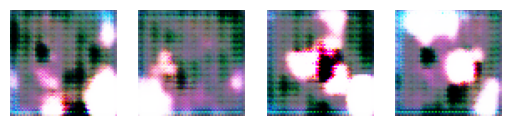

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -7.2470 - g_loss: 1.5128
Epoch 8/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -10.6465 - g_loss: 2.3327

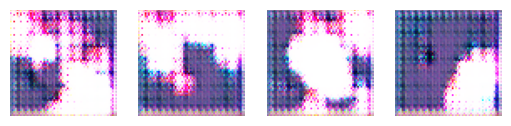

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -10.6496 - g_loss: 2.3346
Epoch 9/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -11.1724 - g_loss: 7.5196

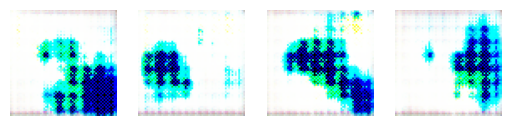

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -11.1738 - g_loss: 7.5143
Epoch 10/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -18.0333 - g_loss: 0.6250

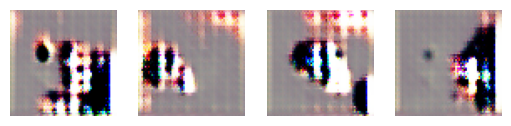

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -18.0348 - g_loss: 0.6267
Epoch 11/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -18.1624 - g_loss: 6.6722

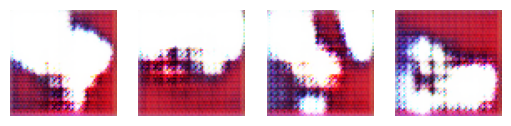

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -18.1572 - g_loss: 6.6840
Epoch 12/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -21.8021 - g_loss: 4.1716

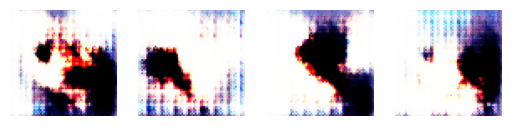

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -21.8034 - g_loss: 4.1779
Epoch 13/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -23.9184 - g_loss: 17.3561

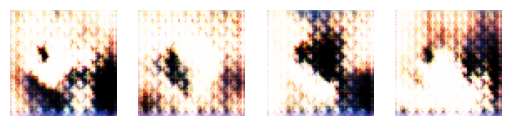

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -23.9265 - g_loss: 17.3563
Epoch 14/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -29.4826 - g_loss: 13.9373

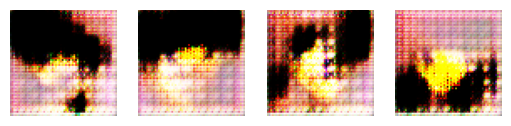

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -29.4741 - g_loss: 13.9621
Epoch 15/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -28.1929 - g_loss: 18.0872

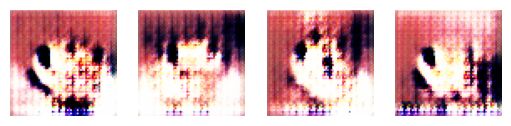

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -28.2064 - g_loss: 18.0848
Epoch 16/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -31.7440 - g_loss: 23.9964

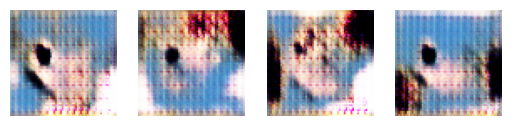

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -31.7462 - g_loss: 24.0075
Epoch 17/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -30.7266 - g_loss: 15.8779

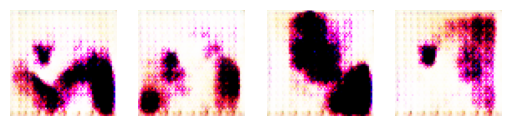

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -30.7277 - g_loss: 15.8768
Epoch 18/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -43.6588 - g_loss: 12.1538

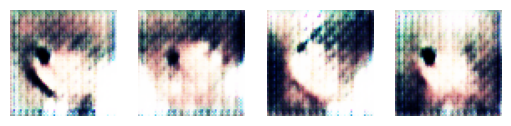

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -43.6522 - g_loss: 12.1822
Epoch 19/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -26.0360 - g_loss: 39.8880

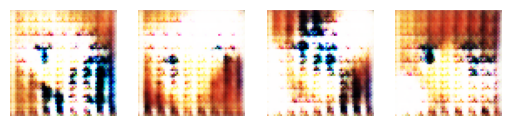

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -26.0737 - g_loss: 39.8822
Epoch 20/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -46.2533 - g_loss: 51.9233

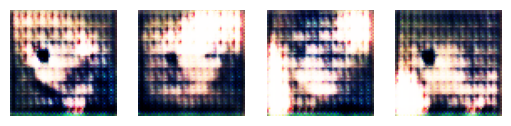

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -46.2521 - g_loss: 51.8449
Epoch 21/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - d_loss: -48.0918 - g_loss: 37.2174

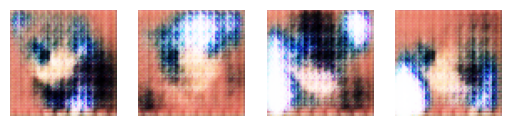

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -48.0907 - g_loss: 37.2294
Epoch 22/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - d_loss: -53.5532 - g_loss: 56.0360

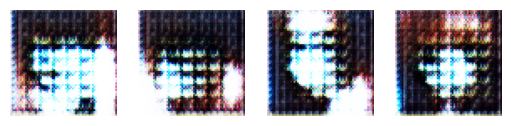

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -53.5505 - g_loss: 56.0439
Epoch 23/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -60.5366 - g_loss: 14.0198

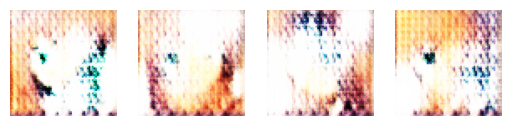

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -60.5183 - g_loss: 14.0364
Epoch 24/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -41.3865 - g_loss: 25.6344

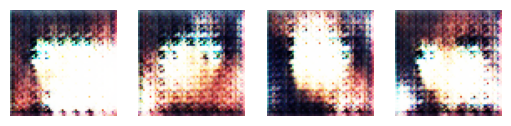

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -41.3601 - g_loss: 25.6553
Epoch 25/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -56.2292 - g_loss: 25.5620

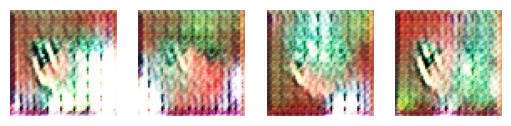

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -56.2127 - g_loss: 25.6081
Epoch 26/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -37.5698 - g_loss: 36.2397

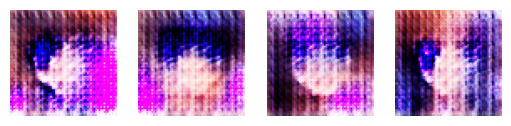

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -37.5516 - g_loss: 36.2739
Epoch 27/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -31.4782 - g_loss: 45.9220

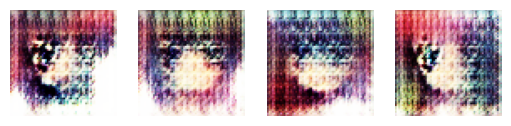

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -31.4648 - g_loss: 45.9181
Epoch 28/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -13.8781 - g_loss: 18.9532

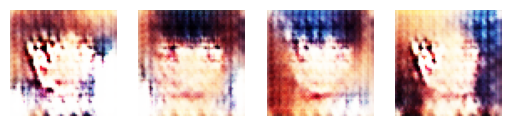

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -13.8973 - g_loss: 18.9583
Epoch 29/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -8.9093 - g_loss: 15.4158

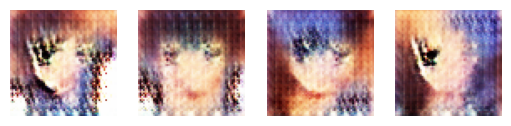

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -8.9248 - g_loss: 15.4300
Epoch 30/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -15.3385 - g_loss: 13.8132

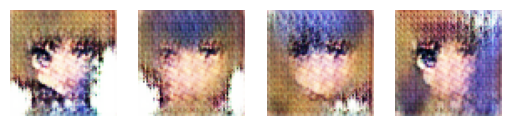

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -15.3377 - g_loss: 13.8227
Epoch 31/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -52.9734 - g_loss: 23.8044

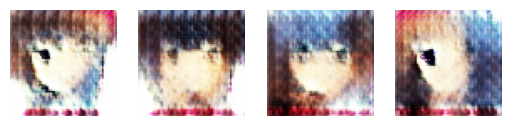

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -52.9526 - g_loss: 23.8102
Epoch 32/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -19.8857 - g_loss: 15.6533

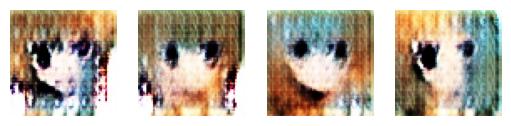

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -19.9446 - g_loss: 15.6569
Epoch 33/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -47.2118 - g_loss: 32.7821

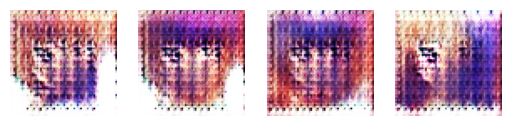

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -47.1510 - g_loss: 32.8307
Epoch 34/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -50.7039 - g_loss: 47.2851

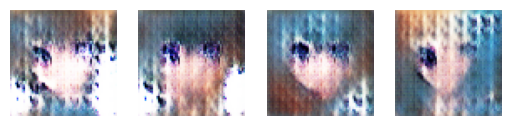

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -50.7385 - g_loss: 47.2598
Epoch 35/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -56.7574 - g_loss: 22.9537

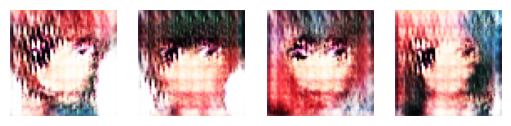

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -56.6907 - g_loss: 22.9664
Epoch 36/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -20.4716 - g_loss: 18.1597

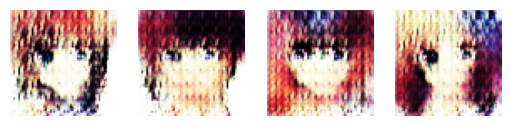

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -20.4732 - g_loss: 18.2048
Epoch 37/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: 4.7285 - g_loss: 24.3680

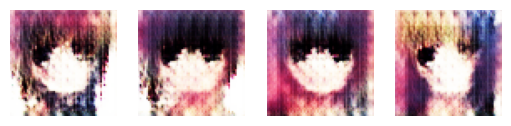

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: 4.6986 - g_loss: 24.3735
Epoch 38/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -4.2411 - g_loss: 20.5573

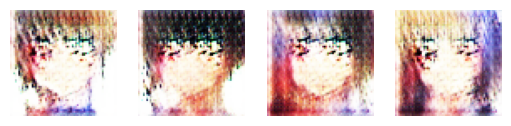

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -4.2398 - g_loss: 20.5667
Epoch 39/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -9.2542 - g_loss: 15.3392

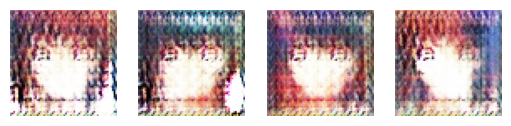

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -9.2588 - g_loss: 15.3464
Epoch 40/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -42.2852 - g_loss: 64.8217

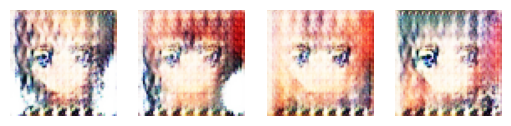

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -42.2962 - g_loss: 64.7755
Epoch 41/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -48.3866 - g_loss: 30.8126

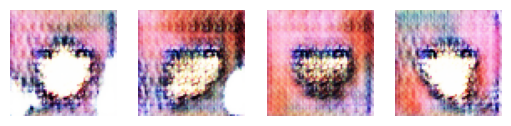

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -48.4199 - g_loss: 30.8011
Epoch 42/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -63.0197 - g_loss: 28.5170

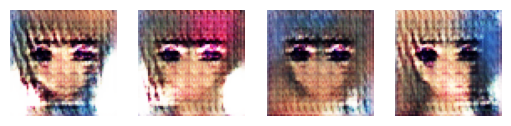

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -62.9443 - g_loss: 28.5336
Epoch 43/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -36.8439 - g_loss: 39.2198

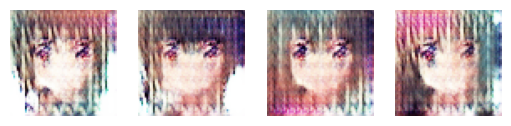

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -36.8074 - g_loss: 39.2294
Epoch 44/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -15.8023 - g_loss: 36.9216

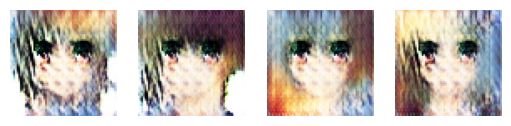

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -15.8235 - g_loss: 36.9216
Epoch 45/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -8.8587 - g_loss: 22.0180

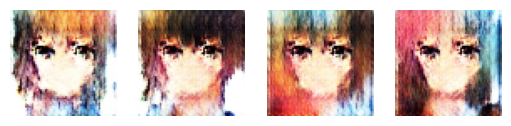

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -8.8569 - g_loss: 22.0199
Epoch 46/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -6.0983 - g_loss: 23.2842

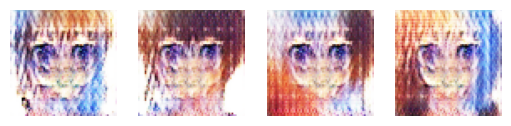

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -6.1075 - g_loss: 23.2782
Epoch 47/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -51.3300 - g_loss: 45.1176

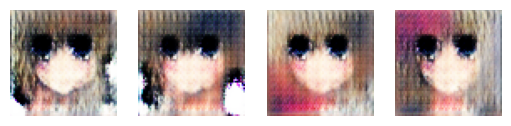

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -51.3305 - g_loss: 45.1506
Epoch 48/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -8.5640 - g_loss: 16.7931

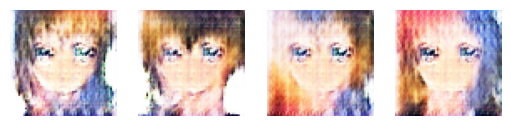

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -8.5814 - g_loss: 16.8030
Epoch 49/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -15.2405 - g_loss: 34.0881

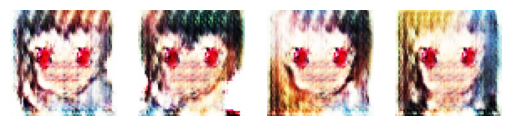

674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - d_loss: -15.2426 - g_loss: 34.0858
Epoch 50/50
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: -35.6530 - g_loss: 31.3978

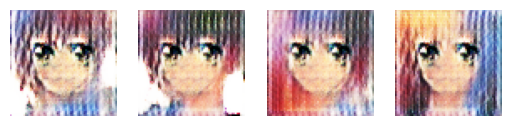

674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - d_loss: -35.6362 - g_loss: 31.3954


In [34]:
N_EPOCHS = 50 
dcgan.fit(train_images, epochs = N_EPOCHS, callbacks = [DCGANMonitor()])